# Рынок заведений общественного питания в Москве

У нас есть сведения о заведениях общественного питания, находящихся в Москве. Нам известны названия, категория, адрес и географические координаты заведений, часы их работы, рейтинг заведений, средний чек, средняя стоимость чашки капучино, входит ли заведение в сеть или нет и количество посадочных мест.

Цель исследования - подготовить исследование рынка общественного питания Москвы для выбора подходящего инвесторам места.
Для этого проанализируем какие категории представлены, каких заведений больше и где они расположены, сколько посадочных мест в заведениях, влияет ли на оценку заведения и другие параметры принадлежность его сети. Посмотрим, в каких округах города меньше конкуренция и какова средняя стоимость. 


Исследование будет состоять из следующих этапов:

- [1. Получение общей информации](#general)
- [2. Подготовка данных](#prepearing)
- [3. Анализ данных](#research)
- [3.1 Исследование категорий заведений](#category)
- [3.2 Исследование количества посадочных мест](#seats)
- [3.3 Популярные сети заведений](#popular_chains)
- [3.4 Распределение заведений по округам](#districts)
- [3.5 Исследование рейтинга заведений](#ratings)
- [3.6 Улицы и заведения](#streets)
- [3.7 Выводы](#conclusions)
- [4. Открываем кофейню](#coffee_open)

## 1. Получение общей информации  <a id="general"></a>

In [1]:
#!pip install transliterate

     |████████████████████████████████| 45 kB 961 kB/s eta 0:00:011


In [2]:
#pip install matplotlib --upgrade

     |████████████████████████████████| 11.6 MB 2.6 MB/s eta 0:00:01
     |████████████████████████████████| 310 kB 127.2 MB/s eta 0:00:01
     |████████████████████████████████| 4.6 MB 92.7 MB/s eta 0:00:01
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.3.4
    Uninstalling matplotlib-3.3.4:
      Successfully uninstalled matplotlib-3.3.4
Note: you may need to restart the kernel to use updated packages.


In [3]:
#pip install plotly --upgrade

     |████████████████████████████████| 15.7 MB 1.8 MB/s eta 0:00:01
  Attempting uninstall: plotly
    Found existing installation: plotly 5.4.0
    Uninstalling plotly-5.4.0:
      Successfully uninstalled plotly-5.4.0
Note: you may need to restart the kernel to use updated packages.


In [4]:
# устанавливаем необходимые библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import plotly.express as px
import json
import folium
import re

# импортируем карту, маркер и хороплет
from folium import Map, Marker, Choropleth
# импортируем кластер
from folium.plugins import MarkerCluster
import transliterate
from transliterate import translit

In [5]:
# получаем данные 
try:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv',sep=',')
except:
    data = pd.read_csv('/datasets/moscow_places.csv', sep=',') 

data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


Изучим общую информацию о наших данных.

У нас есть информация о 8406 заведениях общественного питания в Москве: название,категория заведения (кафе, ресторан, кофейня, пиццерия и т.д.), адрес, часы работы, в каком округе Москвы находится данное заведение, географические координаты, рейтинг заведения, уровень цен, информация о среднем счете, входит ли заведение в сеть общественного питания и количество посадочных мест в нем.

In [6]:
pd.set_option('display.max_rows', None) # Выведем все строки на печать.

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В таблице только три столбца имеют количественные значения, остальные - категориальные.

## 2.Подготовка данных <a id="prepearing"></a>

Посмотрим, сколько пропусков в наших данных

In [8]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

У нас много пропусков в столбцах `price`,`avg_bill`,`middle_avg_bill`,`middle_coffee_cup` и `seats`.

При этом столбцы `avg_bill`,`middle_avg_bill`,`middle_coffee_cup` связаны между собой, последние два получают данные из первого, проверим нет ли значений из первого столбца, не попавших в два последних.

In [9]:
for i in range(data.shape[0]):
    if pd.isnull(data.loc[i,'avg_bill'])==False:
        if 'Средний счёт' in data.loc[i,'avg_bill'].split(':'):
            if pd.isnull(data.loc[i,'middle_avg_bill'])==True:
                print('Ошибка')
        elif 'Цена чашки капучино' in data.loc[i,'avg_bill'].split(':'):
            if pd.isnull(data.loc[i,'middle_coffee_cup'])==True:
                print('Ошибка')
          

Заполним пропуски в столбцах `hours`, `price` и `avg_bill` пустыми строками.

In [10]:
for column in ['hours','price','avg_bill']:
    data[column] = data[column].fillna('')
    display(data[column].isna().sum())

0

0

0

Проверим наши данные на наличие дубликатов.

In [11]:
data.duplicated().sum()

0

Как видим, явных дубликатов нет. Посмотрим есть ли у нас неявные дубликаты. Для этого создадим новый столбец `name_translit`, в котором будет храниться транслитерация названия заведения на русском языке. 

In [12]:

# в столбец 'name_translit' запишем транслитерацию названия, при этом переведем его в нижний регистр, уберем лишние пробелы,
# точки, апострофы, восклицательные знаки и знаки решетки в начале и конце названия
for i in range(data.shape[0]):
    data.loc[i,'name_translit'] = translit(data.loc[i,'name'],'ru').replace('Ц','С').lower().strip(' ._!`#')

Проверим,есть ли в наших данные дубликаты по названию и адресу, так как название заведения может быть написано как на русском, так и латиницей,могут быть написаны с большой или маленькой буквы а так же могут быть добавлены различные знаки в начале и конце названия, то сравнивать будем по столбцам `name_translit` и `address`.

In [13]:
data[data.duplicated(['name_translit','address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_translit
600,В парке вкуснее,кофейня,"Москва, Северный административный округ, район...",Северный административный округ,"ежедневно, 10:00–21:00",55.851985,37.478492,2.2,,,NaN,NaN,1,NaN,в парке вкуснее
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,,,NaN,NaN,1,188.0,море поке
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,,,NaN,NaN,1,150.0,раковарня клешни и хвосты
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,,55.738449,37.410937,4.1,,,NaN,NaN,0,276.0,хлеб да выпечка
3279,Zeфир,кофейня,"Москва, Береговой проезд, 5А, корп. 1",Западный административный округ,"ежедневно, 09:00–22:00",55.755190,37.509666,4.0,средние,Цена чашки капучино:100–150 ₽,NaN,125.0,0,140.0,зефир
5316,Леон,ресторан,"Москва, улица Металлургов, 29А",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.4,,,NaN,NaN,0,NaN,леон
5782,Zефир,кофейня,"Москва, Верейская улица, 29, стр. 134",Западный административный округ,пн-пт 08:00–18:30,55.709377,37.442266,3.7,,Средний счёт:250–350 ₽,300.0,NaN,1,NaN,зефир


Получили семь заведений, у которых есть дубликаты в наших данных. Рассмотрим их в отдельности.

In [14]:
data.query('name_translit=="в парке вкуснее"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_translit
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,,,NaN,NaN,1,NaN,в парке вкуснее
599,В парке вкуснее!,кафе,"Москва, Северный административный округ, район...",Северный административный округ,"ежедневно, 10:00–21:00",55.854571,37.487254,2.2,,,NaN,NaN,0,NaN,в парке вкуснее
600,В парке вкуснее,кофейня,"Москва, Северный административный округ, район...",Северный административный округ,"ежедневно, 10:00–21:00",55.851985,37.478492,2.2,,,NaN,NaN,1,NaN,в парке вкуснее
7473,В парке вкуснее,кофейня,"Москва, парк Борисовские пруды",Южный административный округ,"ежедневно, 10:00–21:00",55.633198,37.706064,4.3,,,NaN,NaN,1,NaN,в парке вкуснее
7474,В парке вкуснее,кофейня,"Москва, парк имени 850-летия города Москвы",Юго-Восточный административный округ,"ежедневно, 10:00–21:00",55.642314,37.728390,4.6,,,NaN,NaN,1,NaN,в парке вкуснее


In [15]:
display(data.loc[599,'address'])

'Москва, Северный административный округ, район Левобережный, территория парка Дружбы'

In [16]:
data.query('name_translit=="море поке"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_translit
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,,,NaN,NaN,0,188.0,море поке
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,,,NaN,NaN,1,188.0,море поке
2813,Море Поке,кафе,"Москва, Краснобогатырская улица, 90с2",Восточный административный округ,"ежедневно, 10:00–22:00",55.801005,37.710638,4.4,средние,Средний счёт:450–900 ₽,675.0,NaN,0,NaN,море поке
6088,More Poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,,,NaN,NaN,1,NaN,море поке


In [17]:
data.query('name_translit=="раковарня клешни и хвосты"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_translit
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,,,NaN,NaN,0,150.0,раковарня клешни и хвосты
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,,,NaN,NaN,1,150.0,раковарня клешни и хвосты
7270,Раковарня Клешни и хвосты,"бар,паб","Москва, Братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.659744,37.752984,4.9,средние,Цена бокала пива:150–250 ₽,NaN,NaN,1,40.0,раковарня клешни и хвосты


In [18]:
data.query('name_translit=="хлеб да выпечка"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_translit
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,,,NaN,NaN,1,276.0,хлеб да выпечка
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,,55.738449,37.410937,4.1,,,NaN,NaN,0,276.0,хлеб да выпечка
7937,Хлеб да Выпечка,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,,,NaN,NaN,1,NaN,хлеб да выпечка


In [19]:
data.query('name_translit=="зефир"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_translit
3184,Зефир,кофейня,"Москва, Береговой проезд, 5А, корп. 1",Западный административный округ,"ежедневно, 09:00–22:00",55.755311,37.509987,4.3,,,NaN,NaN,1,140.0,зефир
3239,Zефир,кофейня,"Москва, проспект Маршала Жукова, 1, стр. 1",Северо-Западный административный округ,пн-пт 08:00–19:00,55.774875,37.505665,4.3,,,NaN,NaN,1,130.0,зефир
3279,Zeфир,кофейня,"Москва, Береговой проезд, 5А, корп. 1",Западный административный округ,"ежедневно, 09:00–22:00",55.755190,37.509666,4.0,средние,Цена чашки капучино:100–150 ₽,NaN,125.0,0,140.0,зефир
5702,Зефир,кофейня,"Москва, Верейская улица, 29, стр. 134",Западный административный округ,пн-пт 08:00–18:30,55.709449,37.442311,4.1,,,NaN,NaN,1,NaN,зефир
5782,Zефир,кофейня,"Москва, Верейская улица, 29, стр. 134",Западный административный округ,пн-пт 08:00–18:30,55.709377,37.442266,3.7,,Средний счёт:250–350 ₽,300.0,NaN,1,NaN,зефир


In [20]:
data.query('name_translit=="леон"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_translit
1053,Leon,ресторан,"Москва, проспект Мира, 119, стр. 10",Северо-Восточный административный округ,"вт-пт 12:00–20:00; сб,вс 12:00–22:00",55.829632,37.629695,4.0,,,NaN,NaN,1,NaN,леон
5314,Leon,ресторан,"Москва, улица Металлургов, 29А",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.3,,,NaN,NaN,1,NaN,леон
5316,Леон,ресторан,"Москва, улица Металлургов, 29А",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.4,,,NaN,NaN,0,NaN,леон


Уберем неявные дубликаты из наших данных.

In [21]:
# создаем словарь с указанием, какую функцию к какому столбцу применить
multi_agg = {'category':['max'], 'hours':['max'],
               'lat':['mean'],'lng':['mean'],
               'rating':['mean'],'price':['max'], 'avg_bill':['max'],
             'middle_avg_bill':['mean'],'middle_coffee_cup':['mean'],'chain':['max'],'seats':['mean'] }

# сгруппируем данные по транслитерации названия, адресу и округу
data_new = data.groupby(['name_translit','address','district']).agg(multi_agg)
# переименуем названия столбцов
data_new.columns = ['category','hours','lat','lng','rating','price','avg_bill',
                    'middle_avg_bill','middle_coffee_cup','chain','seats']
display(data_new.query('name_translit=="хлеб да выпечка"'))


category  \
name_translit   address                      district                                   
хлеб да выпечка Москва, Каширское шоссе, 61Г Южный административный округ     кофейня   
                Москва, Ярцевская улица, 19  Западный административный округ     кафе   

                                                                                               hours  \
name_translit   address                      district                                                  
хлеб да выпечка Москва, Каширское шоссе, 61Г Южный административный округ     ежедневно, 09:00–22:00   
                Москва, Ярцевская улица, 19  Западный административный округ  ежедневно, 09:00–22:00   

                                                                                    lat  \
name_translit   address                      district                                     
хлеб да выпечка Москва, Каширское шоссе, 61Г Южный административный округ     55.621379   
                Москва, Ярцевская улица, 19  Западный административный округ  55.738668   

                                                                                    lng  \
name_translit   address                      district                                     
хлеб да выпечка Москва, Каширское шоссе, 61Г Южный административный округ     37.714108   
                Москва, Ярцевская улица, 19  Западный административный округ  37.411293   

                                                                              rating  \
name_translit   address                      district                                  
хлеб да выпечка Москва, Каширское шоссе, 61Г Южный административный округ        4.5   
                Москва, Ярцевская улица, 19  Западный административный округ     4.1   

                                                                             price  \
name_translit   address                      district                                
хлеб да выпечка Москва, Каширское шоссе, 61Г Южный административный округ            
                Москва, Ярцевская улица, 19  Западный административный округ         

                                                                             avg_bill  \
name_translit   address                      district                                   
хлеб да выпечка Москва, Каширское шоссе, 61Г Южный административный округ               
                Москва, Ярцевская улица, 19  Западный административный округ            

                                                                              middle_avg_bill  \
name_translit   address                      district                                           
хлеб да выпечка Москва, Каширское шоссе, 61Г Южный административный округ                 NaN   
                Москва, Ярцевская улица, 19  Западный административный округ              NaN   

                                                                              middle_coffee_cup  \
name_translit   address                      district                                             
хлеб да выпечка Москва, Каширское шоссе, 61Г Южный административный округ                   NaN   
                Москва, Ярцевская улица, 19  Западный административный округ                NaN   

                                                                              chain  \
name_translit   address                      district                                 
хлеб да выпечка Москва, Каширское шоссе, 61Г Южный административный округ         1   
                Москва, Ярцевская улица, 19  Западный административный округ      1   

                                                                              seats  
name_translit   address                      district                                
хлеб да выпечка Москва, Каширское шоссе, 61Г Южный административный округ       NaN  
                Москва, Ярцевская улица, 19  Западный административный округ  276.0

In [22]:
# удалим дулирующиеся строки в основном датафрейме data
data = data.drop_duplicates(subset=['name_translit','address','district'], keep='last').reset_index(drop=True)
               
# объединим таблицы data и data_new 
data = (data.merge(data_new, on=['name_translit','address','district'], how='left')
            .drop(['category_x','hours_x', 'lat_x','lng_x','rating_x','price_x',
                         'avg_bill_x','middle_avg_bill_x','middle_coffee_cup_x','chain_x','seats_x'],
                         axis=1)
            .rename(columns={'category_y':'category',
                                  'hours_y':'hours','lat_y':'lat','lng_y':'lng','rating_y':'rating',
                                  'price_y':'price','avg_bill_y':'avg_bill','middle_avg_bill_y':'middle_avg_bill',
                                  'middle_coffee_cup_y':'middle_coffee_cup','chain_y':'chain','seats_y':'seats'
                                })
       )
                       
display(data.query('name_translit=="хлеб да выпечка"'))

,name,address,district,name_translit,category,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3105,Хлеб да выпечка,"Москва, Ярцевская улица, 19",Западный административный округ,хлеб да выпечка,кафе,"ежедневно, 09:00–22:00",55.738668,37.411293,4.1,,,NaN,NaN,1,276.0
7930,Хлеб да Выпечка,"Москва, Каширское шоссе, 61Г",Южный административный округ,хлеб да выпечка,кофейня,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,,,NaN,NaN,1,NaN


Проверим еще раз на пропуски в данных нашу таблицу.

In [23]:
data.isna().sum()

name                    0
address                 0
district                0
name_translit           0
category                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
middle_avg_bill      5250
middle_coffee_cup    7864
chain                   0
seats                3608
dtype: int64

Как видим, остались пропуски только в количественных значениях. Посмотрим на каждый столбец в отдельности.

Начнем со столбца `middle_avg_bill`

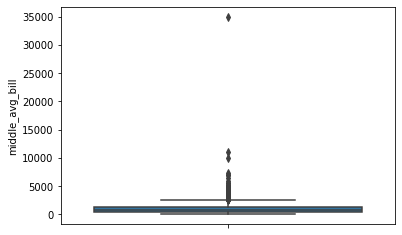

In [24]:
ax = sns.boxplot(y="middle_avg_bill", data=data);

Видим, что значения больше 5000 руб. являются выбросами, посмотрим на значения внимательнее.

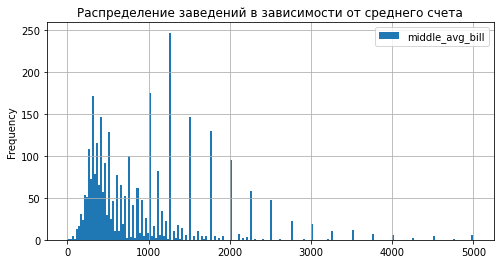

In [25]:
data.plot(y='middle_avg_bill', kind='hist', bins=200, range=(0,5000), grid=True, 
          xlabel='Сумма среднего чека', ylabel='Количество заведений', 
          title='Распределение заведений в зависимости от среднего счета', figsize=(8,4));

In [26]:
data[data['middle_avg_bill']>5000]

,name,address,district,name_translit,category,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
729,Чойхона,"Москва, Дмитровское шоссе, 95А",Северный административный округ,чойхона,"бар,паб","ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
2792,Крошка Картошка,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,крошка картошка,быстрое питание,"ежедневно, 10:00–22:00",55.811160,37.799823,4.0,высокие,Средний счёт:1000–10000 ₽,5500.0,NaN,1,NaN
3035,Беллини,"Москва, Рублёвское шоссе, 28",Западный административный округ,беллини,ресторан,"ежедневно, 12:00–00:00",55.747632,37.425631,4.3,высокие,Средний счёт:5000–5500 ₽,5250.0,NaN,0,150.0
3391,Марио,"Москва, улица Климашкина, 17",Центральный административный округ,марио,ресторан,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,NaN,0,100.0
3482,800°с Contemporary Steak,"Москва, Большой Патриарший переулок, 6, стр. 1",Центральный административный округ,800°с сонтемпорары стеак,ресторан,"ежедневно, 09:00–23:30",55.762708,37.592138,4.7,высокие,Средний счёт:6000–8000 ₽,7000.0,NaN,0,75.0
3513,Чайка,"Москва, Краснопресненская набережная, 12А",Центральный административный округ,чайка,ресторан,"ежедневно, 12:00–00:00",55.752857,37.556365,4.8,высокие,Средний счёт:5000–8000 ₽,6500.0,NaN,1,250.0
3598,Lucky Izakaya Bar,"Москва, Калашный переулок, 9",Центральный административный округ,луцкы изакаыа бар,"бар,паб","пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.757313,37.599581,4.8,высокие,Средний счёт:5500 ₽,5500.0,NaN,0,NaN
3877,White Rabbit,"Москва, Смоленская площадь, 3",Центральный административный округ,wхите раббит,ресторан,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7250.0,NaN,0,150.0
3905,Кантинетта Антинори,"Москва, Денежный переулок, 20",Центральный административный округ,кантинетта антинори,ресторан,"ежедневно, 12:00–00:00",55.745383,37.586595,4.7,высокие,Средний счёт:6000 ₽,6000.0,NaN,0,80.0
5475,Гости,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,гости,ресторан,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN


Заведения, у которых средний чек больше 5000 руб., в основном представляют собой рестораны и бары, у которых может быть 
такие высокие цены. Поэтому оставим их в таблице.

Рассмотрим столбец `middle_coffee_cup`

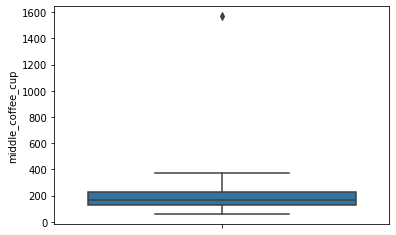

In [27]:
ax = sns.boxplot(y="middle_coffee_cup", data=data)

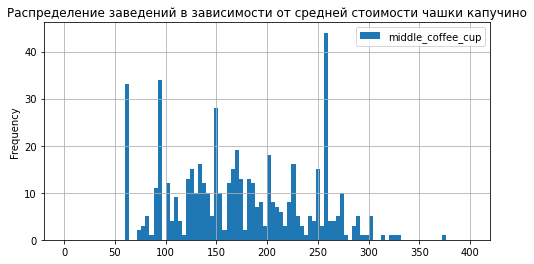

In [28]:
data.plot(y='middle_coffee_cup', kind='hist', bins=100, range=(0,400), grid=True, 
          xlabel='Сумма среднего чека', ylabel='Количество заведений', 
          title='Распределение заведений в зависимости от средней стоимости чашки капучино', figsize=(8,4));

В этом столбце есть единственное выпадающее значение, посмотрим, какие данные мы имеем.

In [29]:
data[data['middle_coffee_cup']>1500]

,name,address,district,name_translit,category,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2856,Шоколадница,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,шоколадница,кофейня,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


Это одно из заведений сети кофеен Шоколадница, скорее всего в столбце `avg_bill` произошла опечатка, поэтому заменим значение в столбце `middle_coffee_cup` на медианное по сети.

In [30]:
data[data['name']=='Шоколадница']['middle_coffee_cup'].median()

256.0

Заменим значение в столбце `middle_coffee_cup` на медианное по сети.

In [31]:
data.loc[2856,'middle_coffee_cup'] = 256

Осталось проверить последнее количественное значение `seats`.

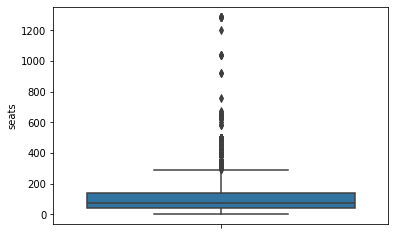

In [32]:
ax = sns.boxplot(y="seats", data=data)

Видим, что много выбивающихся значений, больше 300.

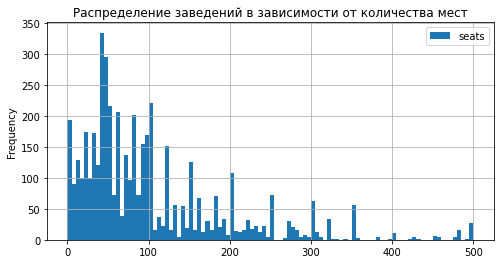

In [33]:
data.plot(y='seats', kind='hist', bins=100, range=(0,500), grid=True, 
          xlabel='количество посадочных мест', ylabel='Количество заведений', 
          title='Распределение заведений в зависимости от количества мест', figsize=(8,4));

In [34]:
data[data['seats']>500]

,name,address,district,name_translit,category,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1325,Нам,"Москва, Ленинградский проспект, 69, стр. 1",Северный административный округ,нам,"бар,паб","ежедневно, 11:00–21:00",55.803236,37.517898,4.2,,,NaN,NaN,1,625.0
1350,Максима Пицца,"Москва, Ленинградский проспект, 78, корп. 1",Северный административный округ,максима пицца,пиццерия,"пн-пт 09:00–00:00; сб,вс 10:00–00:00",55.805807,37.513994,4.3,выше среднего,Средний счёт:1500–1800 ₽,1650.0,NaN,0,625.0
1354,Страдивари,"Москва, Ленинградский проспект, 77, корп. 1",Северный административный округ,страдивари,ресторан,"ежедневно, 11:00–23:00",55.804980,37.509454,4.2,выше среднего,Средний счёт:1000–2000 ₽,1500.0,NaN,1,625.0
1366,Академия,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,академия,пиццерия,"пн-пт 09:00–23:00; сб,вс 11:00–23:00",55.805579,37.520086,4.2,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,1,625.0
1379,Север-Метрополь,"Москва, Ленинградский проспект, 75, корп. 1",Северный административный округ,север-метрополь,кофейня,"ежедневно, 09:00–21:00",55.804940,37.512423,4.6,,,NaN,NaN,1,625.0
1384,Чайхона на Соколе,"Москва, Ленинградский проспект, 69, стр. 1",Северный административный округ,чайхона на соколе,кафе,"ежедневно, 08:00–23:00",55.803236,37.517931,4.3,средние,Средний счёт:400–800 ₽,600.0,NaN,0,625.0
1392,Кулинарная лавка братьев Караваевых,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,кулинарная лавка братьев караваевых,кафе,"ежедневно, 08:00–23:00",55.805791,37.520339,4.3,,Средний счёт:500–800 ₽,650.0,NaN,1,625.0
1440,ABC coffee roasters,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,абс цоффее роастерс,кофейня,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.805547,37.520395,4.5,средние,Цена чашки капучино:220–270 ₽,NaN,245.0,0,625.0
1444,9 Bar Coffee,"Москва, Ленинградский проспект, 80, корп. 1",Северный административный округ,9 бар соффее,кофейня,"пн-пт 07:30–21:00; сб,вс 07:30–19:00",55.810352,37.506625,4.3,,Цена чашки капучино:60–150 ₽,NaN,105.0,1,625.0
1462,Находка,"Москва, Ленинградский проспект, 74, корп. 1",Северный административный округ,находка,ресторан,"ежедневно, 09:00–22:00",55.804972,37.517319,4.9,,,NaN,NaN,1,625.0


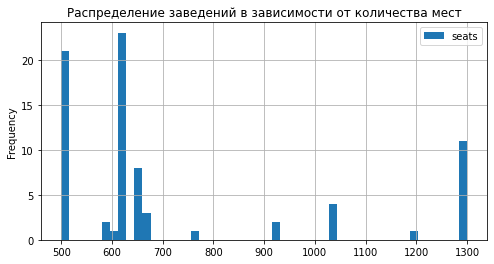

In [35]:
data.plot(y='seats', kind='hist', bins=50, range=(500,1300), grid=True, 
          xlabel='количество посадочных мест', ylabel='Количество заведений', 
          title='Распределение заведений в зависимости от количества мест', figsize=(8,4));

Большие значения количества посадочных мест можно объяснить расположением нескольких заведений на фудкортах торговых центров, стадионов и других мест с большим скоплением людей. Также не будем удалять такие значения, иначе мы можем получить данные только по отдельно стоящим заведениям или небольшоим фудкортам. 

Посмотрим на оставшиеся категориальные значения, проверим, что нет дубликатов в их значениях

In [36]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [37]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [38]:
data['price'].unique()

array(['', 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [39]:
data['avg_bill'].unique()

array(['', 'Средний счёт:1500–1600 ₽', 'Средний счёт:от 1000 ₽',
       'Цена чашки капучино:155–185 ₽', 'Средний счёт:400–600 ₽',
       'Средний счёт:199 ₽', 'Средний счёт:200–300 ₽',
       'Средний счёт:от 500 ₽', 'Средний счёт:1000–1200 ₽',
       'Цена бокала пива:250–350 ₽', 'Средний счёт:330 ₽',
       'Средний счёт:1500 ₽', 'Средний счёт:300–500 ₽',
       'Средний счёт:140–350 ₽', 'Средний счёт:350–500 ₽',
       'Средний счёт:300–1500 ₽', 'Средний счёт:от 240 ₽',
       'Средний счёт:200–250 ₽', 'Средний счёт:328 ₽',
       'Средний счёт:300 ₽', 'Средний счёт:от 345 ₽',
       'Средний счёт:60–400 ₽', 'Средний счёт:900 ₽',
       'Средний счёт:500–800 ₽', 'Средний счёт:500–1000 ₽',
       'Средний счёт:600–700 ₽', 'Цена бокала пива:120–350 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1500–2000 ₽',
       'Цена чашки капучино:150–190 ₽', 'Средний счёт:2000–2500 ₽',
       'Средний счёт:600 ₽', 'Средний счёт:450 ₽',
       'Цена чашки капучино:120–170 ₽', 'Средний счёт

Видим, что проблем в данных в этих столбцах нет, нет ни лишних пробелов, ни различий в написании, ни в регистре.

Создадим новый столбец с названием улицы.

In [40]:
data['address'].unique()

array(['Москва, улица Дыбенко, 7/1', 'Москва, улица Дыбенко, 36, корп. 1',
       'Москва, Клязьминская улица, 15', ...,
       'Москва, улица Лобачевского, 52, корп. 1',
       'Москва, Болотниковская улица, 52, корп. 2',
       'Москва, Чонгарский бульвар, 26А, корп. 1'], dtype=object)

In [41]:
# зададим несколько условий для окончания адреса
ends_by_char_pattern = re.compile("\D\s*$") # строка заканчивается любым символом, кроме цифры
end_by_number_of_pattern = re.compile("№\s*\d+\s*$") # строка заканчивается на № и любые цифры
end_by_number_char_pattern = re.compile("№$") # строка заканчивается на №
end_by_home_number_with_char = re.compile("\d+\D$") # строка заканчивается на цыфру и любой символ (например, 18А)

def has_numbers(inputString):
    """Создадим функцию, которая обрабатывает входящую строку:
    - если  в строке есть хотя бы один числовой символ, то функция возвращает True
    - если в строке нет ни одного числового символа, то функция возвращает False
    """
    return any(char.isdigit() for char in inputString)

def prepare_street(address):
    """Создадим функцию, которая обрабатывает входящую строку с адресом:
    - убирает из строки название Москва
    - если перед номером дома нет запятой, то ставим самостоятельно
    - разбивает строку на части по запятым
    - если в части адреса есть числовые значения, то функция проверяет если в эта часть не заканичивается на любой символ, 
    кроме числа и не заканчивается на № и число или заканчивается на число с буквой, то возвращает предыдущую часть 
    - если в частях адреса нет числовых значений, то функция возвращает последнее выражение
    """
    address = address.replace('Москва,','')
    address = address.replace(' д ',', д ')
    
    parts = address.split(',')
    for i in range (len(parts)):
        if has_numbers(parts[i]):
            if( not (ends_by_char_pattern.search(parts[i]) or end_by_number_of_pattern.search(parts[i])) or end_by_home_number_with_char.search(parts[i]) ):
                return parts[i-1]
    return parts[len(parts)-1]    

def get_street(address):
    """Создадим функцию, которая обрабатывает входящую строку:
    - разбивает строку на части по пробелам
    - если в часть попал номер дома, то отбрасывает его
    """
    words = prepare_street(address).split(' ')
    name = ''
    for j in range (len(words)):
        if(len(words[j]) == 0):
            continue
        if(ends_by_char_pattern.search(words[j]) and not (end_by_home_number_with_char.search(words[j])) ):
            name = name + ' ' + words[j]
        else:
            if(end_by_number_char_pattern.search(name)):
                name = name + ' ' + words[j]
            else:
                break
    if(len(name) > 0):
        return name
    return address
                
            
        


print(get_street('Москва, парк Борисовские пруды'))
print(get_street('Москва, Болотниковская улица, 52, корп. 2'))
print(get_street('Москва, 11-я улица Текстильщиков, 1'))
print(get_street('Москва, Коптевский бульвар 18А'))
print(get_street('Болотниковская улица, 52, корп. 2'))
print(get_street('Москва, Проектируемый проезд № 5265'))
print(get_street('Москва, Северный административный округ, район Левобережный, территория парка Дружбы'))


 парк Борисовские пруды
 Болотниковская улица
 11-я улица Текстильщиков
 Коптевский бульвар
 Болотниковская улица
 Проектируемый проезд № 5265
 территория парка Дружбы


In [42]:
# создадим столбец с названием улицы
for i in range(data.shape[0]):
    data.loc[i,'street'] = get_street(data.loc[i,'address'])
data['street']

0                                           улица Дыбенко
1                                           улица Дыбенко
2                                      Клязьминская улица
3                                 улица Маршала Федоренко
4                                     Правобережная улица
5                                          Ижорская улица
6                                      Клязьминская улица
7                                      Клязьминская улица
8                                       Дмитровское шоссе
9                                         Ангарская улица
10                                     Левобережная улица
11                                улица Маршала Федоренко
12                                          80-й километр
13                                        Базовская улица
14                                        Ангарская улица
15                                улица Бусиновская Горка
16                                        Базовская улица
17            

In [43]:
data['street'].value_counts()

 проспект Мира                                                          183
 Профсоюзная улица                                                      122
 проспект Вернадского                                                   108
 Ленинский проспект                                                     107
 Ленинградский проспект                                                  95
 Дмитровское шоссе                                                       88
 Каширское шоссе                                                         77
 Варшавское шоссе                                                        76
 Ленинградское шоссе                                                     70
 Люблинская улица                                                        60
 улица Вавилова                                                          55
 Кутузовский проспект                                                    54
 улица Миклухо-Маклая                                                    49
 Пятницкая у

Создадим новый столбец, в котором будет указано, работает ли заведение круглосуточно:

- если заведение работает круглосуточно, то в столбце будет указано True
- если заведение не работает круглосуточно, то в столбце будет указано False

In [44]:
for i in range(data.shape[0]):
    try:
        if "ежедневно"in data.loc[i,'hours'].split(', ') and "круглосуточно" in data.loc[i,'hours'].split(', '):
            data.loc[i,'is_24_7'] = True
        else:
            data.loc[i,'is_24_7'] = False
    except:
        pass
data.head(50)   

,name,address,district,name_translit,category,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,"Москва, улица Дыбенко, 7/1",Северный административный округ,wоwфли,кафе,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,,,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,четыре комнаты,ресторан,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,"Москва, Клязьминская улица, 15",Северный административный округ,хазри,кафе,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,"Москва, улица Маршала Федоренко, 12",Северный административный округ,дормоусе соффее шоп,кофейня,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,"Москва, Правобережная улица, 1Б",Северный административный округ,иль марко,пиццерия,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,Sergio Pizza,"Москва, Ижорская улица, вл8Б",Северный административный округ,сергио пизза,пиццерия,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,,NaN,NaN,0,NaN,Ижорская улица,False
6,Огни города,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,огни города,"бар,паб",пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,Mr. Уголёк,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,мр. уголёк,быстрое питание,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,Donna Maria,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,донна мариа,ресторан,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,Готика,"Москва, Ангарская улица, 39",Северный административный округ,готика,кафе,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


## 3. Анализ данных <a id="research"></a>

### 3.1 Исследование категорий заведений <a id="category"></a>

Рассмотрим как распределяются заведения по категориям: кафе, ресторан, кофейня, пиццерия, столовая, быстрое питание, булочная, бар или паб.

Для этого построим сводную таблицу.

In [45]:
data_type = data.pivot_table(index='category', values='chain', aggfunc=['sum','count'])
data_type.columns = ['chain_count','total_count']
data_type

,chain_count,total_count
category,,
"бар,паб",168,764
булочная,156,255
быстрое питание,232,603
кафе,780,2377
кофейня,719,1411
пиццерия,330,633
ресторан,731,2041
столовая,88,315


In [46]:
from plotly import graph_objects as go
data_type = data_type.sort_values(by='total_count', ascending=False)
fig = go.Figure(data=[go.Pie(labels=data_type.index, values=data_type['total_count'], pull = [0.1,0,0,0,0,0,0,0])])

fig.update_layout(title='Число заведений общественного питания по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.28, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show() # выводим график

Как видим, в общем числе заведений общественного питания превалирует кафе, в топ-3 типов заведений также входят рестораны и кофейни. 

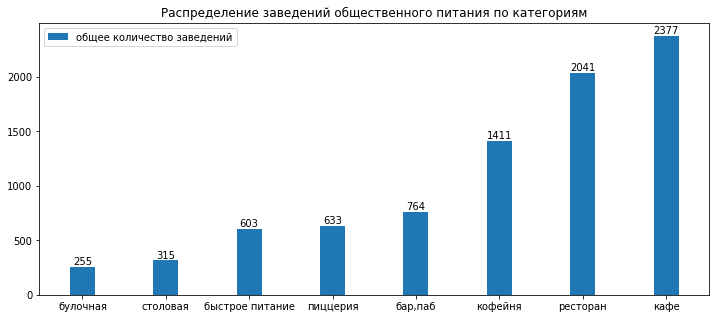

In [47]:
width = 0.3
x = np.arange(data_type.shape[0])

fig, ax = plt.subplots(figsize=(12,5))
data_type = data_type.sort_values(by='total_count')
rects1 = ax.bar(x, data_type['total_count'], width, label='общее количество заведений')
#rects2 = ax.bar(x + width/2, data_type['chain_count'], width, label='количество сетевых заведений')
ax.bar_label(rects1)
#ax.bar_label(rects2)
ax.set_title('Распределение заведений общественного питания по категориям')
ax.set_xticks(x)
ax.set_xticklabels(data_type.index)
ax.legend()
plt.show()


In [48]:
data_type_chain = data.pivot_table(index='category',columns='chain',values='name',aggfunc='count')
data_type_chain.columns=['not_chain','chain']
data_type_chain 

,not_chain,chain
category,,
"бар,паб",596,168
булочная,99,156
быстрое питание,371,232
кафе,1597,780
кофейня,692,719
пиццерия,303,330
ресторан,1310,731
столовая,227,88


In [49]:
data_type_chain = data_type_chain.sort_values(by='not_chain')
data_type_chain

,not_chain,chain
category,,
булочная,99,156
столовая,227,88
пиццерия,303,330
быстрое питание,371,232
"бар,паб",596,168
кофейня,692,719
ресторан,1310,731
кафе,1597,780


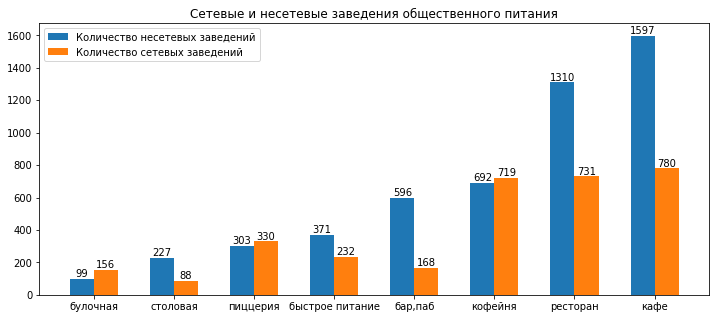

In [50]:
width = 0.3
x = np.arange(data_type.shape[0])

fig, ax = plt.subplots(figsize=(12,5))
rects1 = ax.bar(x-width/2, data_type_chain['not_chain'], width, label='Количество несетевых заведений')
rects2 = ax.bar(x + width/2, data_type_chain['chain'], width, label='Количество сетевых заведений')
ax.bar_label(rects1)
ax.bar_label(rects2)
ax.set_title('Сетевые и несетевые заведения общественного питания')
ax.set_xticks(x)
ax.set_xticklabels(data_type_chain.index)
ax.legend()
plt.show()


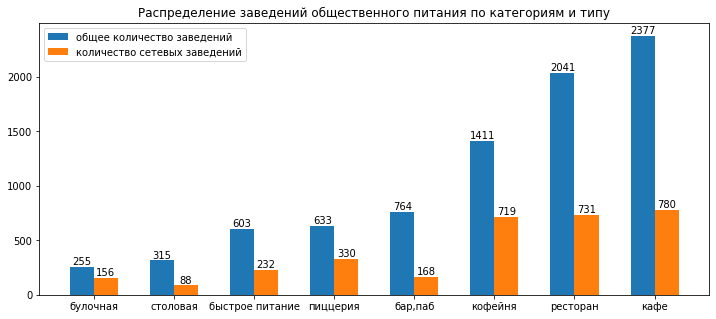

In [51]:
width = 0.3
x = np.arange(data_type.shape[0])

fig, ax = plt.subplots(figsize=(12,5))
data_type = data_type.sort_values(by='total_count')
rects1 = ax.bar(x - width/2, data_type['total_count'], width, label='общее количество заведений')
rects2 = ax.bar(x + width/2, data_type['chain_count'], width, label='количество сетевых заведений')
ax.bar_label(rects1)
ax.bar_label(rects2)
ax.set_title('Распределение заведений общественного питания по категориям и типу')
ax.set_xticks(x)
ax.set_xticklabels(data_type.index)
ax.legend()
plt.show()


Если сравнивать сетевые и несетевые заведения, то можно сказать, что в топ-3 категорий входят кафе, рестораны и кофейни. Однако, абсолютные значения нам не помогут понять заполненность ниши каждой категории сетевыми заведениями, для этого рассмотрим процентное соотношение.

In [52]:
data_type['percent'] = round(data_type['chain_count'] / data_type['total_count'] * 100,2)
data_type = data_type.sort_values(by='percent',ascending=False)
data_type

,chain_count,total_count,percent
category,,,
булочная,156,255,61.18
пиццерия,330,633,52.13
кофейня,719,1411,50.96
быстрое питание,232,603,38.47
ресторан,731,2041,35.82
кафе,780,2377,32.81
столовая,88,315,27.94
"бар,паб",168,764,21.99


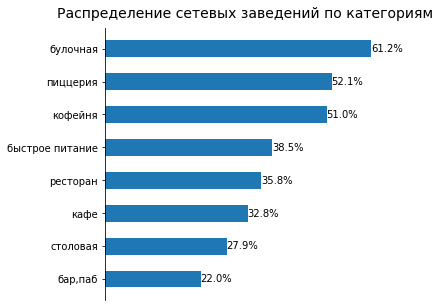

In [53]:
fig, ax = plt.subplots(figsize=(5,5))
data_type=data_type.sort_values(by='percent')

bars = plt.barh(data_type.index, data_type['percent'], height = 0.5)

ax.spines[['right', 'top', 'bottom']].set_visible(False) 
ax.xaxis.set_visible(False)

#ax.bar_label(bars)
ax.set_title('Распределение сетевых заведений по категориям', fontsize=14, pad=10)
ax.bar_label(bars, fmt='%.1f%%')

plt.show()

Таким образом, можно сказать, что в категориях булочных, пиццерий и кофеен больше сетевых заведений, чем несетевых, а вот в категории кафе только треть от всех заведений - сетевые заведения, меньше всего сетевые заведения представлены в категориях баров и столовых, но эти типы заведений занимают лишь 9.1% и 3.75% от общего количества заведений.

### 3.2 Исследование количества посадочных мест <a id="seats"></a>

Изучим, какое количество мест характерно для каждого вида заведения общественного питания.

In [54]:
data_seats = data.pivot_table(index='category', values='seats')
data_seats.columns = ['seats']
data_seats = data_seats.sort_values(by='seats')
data_seats

,seats
category,
булочная,88.115646
пиццерия,94.496487
кафе,97.512315
быстрое питание,98.891117
столовая,99.750000
кофейня,111.161333
ресторан,121.892041
"бар,паб",124.477516


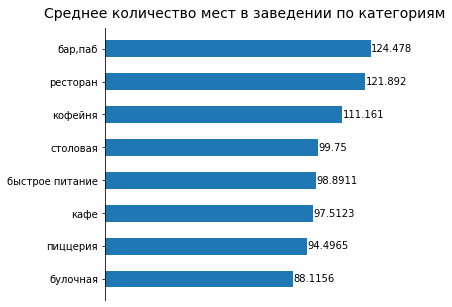

In [55]:
fig, ax = plt.subplots(figsize=(5,5))

bars = plt.barh(data_seats.index, data_seats['seats'], height = 0.5)

ax.spines[['right', 'top', 'bottom']].set_visible(False) 
ax.xaxis.set_visible(False)

ax.bar_label(bars)
ax.set_title('Среднее количество мест в заведении по категориям', fontsize=14, pad=10)

plt.show()

In [56]:
data[data['category']=='бар,паб']['hours'].value_counts()

ежедневно, 12:00–00:00                                                                 59
ежедневно, круглосуточно                                                               52
пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00–00:00                                   44
ежедневно, 11:00–23:00                                                                 42
ежедневно, 12:00–23:00                                                                 26
ежедневно, 10:00–23:00                                                                 24
пн-чт 12:00–00:00; пт,сб 12:00–03:00; вс 12:00–00:00                                   19
                                                                                       18
ежедневно, 11:00–00:00                                                                 17
ежедневно, 10:00–22:00                                                                 14
пн-пт 11:00–05:00; сб,вс 12:00–05:00                                                   14
пн-пт 11:0

В общей картине видно, что в барах и ресторанах наибольшее количество посадочных мест. Возможно, это связано с тем, что в барах не требуется много место для кухни и других подсобных помещений и максимум площади отводится под зал, в котором есть барная стойка и много столиков. В ресторанах, возможно, владельцы могут позволить себе выделить большую площадь под посадочные места.

Меньше всего мест в булочных, но и сам вид заведения предполагает, что люди в основном заходят и покупают выпечку с собой, а не сидят в заведении. 

Посмотрим, влияет ли на количество посадочных мест в заведении его сетевая принадлежность.

In [57]:
data_seats_chain = data.pivot_table(index = 'category', columns=['chain'],values='seats')
data_seats_chain.columns=['not_chain','chain']
data_seats_chain = data_seats_chain.sort_values(by='chain', ascending=True)
data_seats_chain

,not_chain,chain
category,,
булочная,86.454545,89.108696
пиццерия,93.469274,95.237903
"бар,паб",131.392157,102.036364
кафе,93.880711,104.167442
столовая,96.091667,109.727273
быстрое питание,90.360731,113.261538
кофейня,98.850440,121.425428
ресторан,112.647205,137.931034


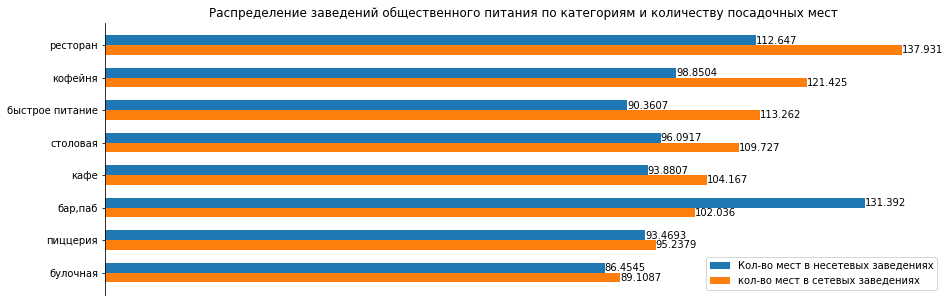

In [58]:
width = 0.3
x = np.arange(data_seats_chain.shape[0])

fig, ax = plt.subplots(figsize=(15,5))
#data_type = data_type.sort_values(by='total_count')
rects1 = ax.barh(x + width/2, data_seats_chain['not_chain'], width, label='Кол-во мест в несетевых заведениях')
rects2 = ax.barh(x - width/2, data_seats_chain['chain'], width, label='кол-во мест в сетевых заведениях')
ax.bar_label(rects1)
ax.bar_label(rects2)
ax.set_title('Распределение заведений общественного питания по категориям и количеству посадочных мест')
ax.set_yticks(x)
ax.set_yticklabels(data_seats_chain.index)
ax.spines[['right', 'top', 'bottom']].set_visible(False) 
ax.xaxis.set_visible(False)
ax.legend()
plt.show()


<div class="alert alert-block alert-success">
    
<b>Комментарий ревьюера:</b> Молодец, что добавляешь сортировку на все графики.
</div>

In [59]:
data.query('category=="бар,паб" & chain ==1')

,name,address,district,name_translit,category,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
87,Гриль Хаус,"Москва, Алтуфьевское шоссе, 70к1",Северо-Восточный административный округ,гриль хаус,"бар,паб","ежедневно, 11:00–23:00",55.888065,37.589321,4.3,средние,Средний счёт:от 850 ₽,850.0,NaN,1,NaN,Алтуфьевское шоссе,False
133,Крепери,"Москва, улица Лескова, 14",Северо-Восточный административный округ,крепери,"бар,паб","ежедневно, 10:00–22:00",55.897490,37.604722,4.0,,,NaN,NaN,1,NaN,улица Лескова,False
220,Тбилисо,"Москва, Студёный проезд, 36",Северо-Восточный административный округ,тбилисо,"бар,паб","ежедневно, 11:00–23:00",55.892729,37.671393,4.3,средние,Средний счёт:600–700 ₽,650.0,NaN,1,80.0,Студёный проезд,False
228,МСК Lounge,"Москва, Широкая улица, 24Б",Северо-Восточный административный округ,мск лоунге,"бар,паб","пн-пт 11:00–05:00; сб,вс 12:00–05:00",55.886659,37.672920,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,1,NaN,Широкая улица,False
255,Чайхана Самарканд,"Москва, улица Лескова, 19А, стр. 2",Северо-Восточный административный округ,чайхана самарканд,"бар,паб","ежедневно, 11:00–00:00",55.894130,37.616830,4.1,средние,Средний счёт:800–1200 ₽,1000.0,NaN,1,110.0,улица Лескова,False
368,МСК Lounge,"Москва, Кронштадтский бульвар, 6, корп. 2",Северный административный округ,мск лоунге,"бар,паб","пн-пт 11:00–05:00; сб,вс 12:00–05:00",55.841157,37.494387,4.4,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,1,84.0,Кронштадтский бульвар,False
421,Кружка Паб,"Москва, улица Адмирала Макарова, 45",Северный административный округ,кружка паб,"бар,паб","пн-чт 11:00–00:00; пт,сб 12:00–03:00; вс 11:00...",55.838726,37.485988,4.3,средние,Цена бокала пива:от 149 ₽,NaN,NaN,1,NaN,улица Адмирала Макарова,False
429,Мята Lounge,"Москва, Петрозаводская улица, 11, корп. 3, стр. 2",Северный административный округ,мята лоунге,"бар,паб","пн-чт 14:00–02:00; пт,сб 14:00–06:00; вс 14:00...",55.865910,37.495813,4.4,высокие,Средний счёт:2000–2500 ₽,2250.0,NaN,1,72.0,Петрозаводская улица,False
452,Мясо&Паста,"Москва, Головинское шоссе, 8, корп. 2А",Северный административный округ,мясо&паста,"бар,паб","ежедневно, круглосуточно",55.839090,37.492784,4.1,,,NaN,NaN,1,NaN,Головинское шоссе,True
564,Кафе бар,"Москва, Кронштадтский бульвар, 7Б, стр. 14",Северный административный округ,кафе бар,"бар,паб",,55.842266,37.485340,4.1,,,NaN,NaN,1,NaN,Кронштадтский бульвар,False


In [60]:
data_chain_s = data.query('chain==1').pivot_table(index='name_translit',values='seats', aggfunc=['count','mean']) 
data_chain_s.columns = ['count','mean_seats']
data_chain_s.sort_values(by='count', ascending=False).head(15)

,count,mean_seats
name_translit,,
шоколадница,83,135.144578
додо пицца,62,94.596774
доминоьс пицца,61,52.819672
оне прице соффее,52,140.711538
софиx,36,105.750000
яндекс лавка,35,119.000000
приме,33,126.515152
хинкальная,32,80.562500
теремок,27,111.296296


Из графика видно, что сетевые заведения в целом имеют больше посадочных мест, чем несетевые, что вполне объяснимо. Если заведение входит в сеть, то это означает, что оно пользуется известностью и популярностью самой сети, а не конкретного заведения. Качество предостовляемых услуг в каждом заведении сети также находится примерно на одном уровне, поэтому посетитель выбирает не конкретное заведение, а именно сеть, поэтому в сетевых заведениях посадочных мест больше. 

Исключение составляют лишь бары.

### 3.3 Популярные сети заведений <a id="popular_chain"></a>

Рассмотрим топ-15 популярных сетей заведений общественного питания. Под популярностью будем понимать количество заведений сети.

In [61]:
data_chains = (data.query('chain == 1').groupby('name').agg(count_object =('name','count'))
               .sort_values(by='count_object',ascending=False)
               .head(15)
              )
data_chains

,count_object
name,
Шоколадница,120
Домино'с Пицца,76
Додо Пицца,74
One Price Coffee,71
Яндекс Лавка,69
Cofix,65
Prime,50
Хинкальная,44
КОФЕПОРТ,42


In [62]:
data_chains_name=data_chains.index
data_sets = data[data['name'].isin(data_chains_name)].pivot_table(index='name',columns='category',values='chain',aggfunc='count')
data_sets['count'] = data_sets.sum(axis=1)
data_sets = data_sets.sort_values(by='count', ascending=False)
data_sets

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,count
name,,,,,,,,,
Шоколадница,NaN,NaN,NaN,1.0,119.0,NaN,NaN,NaN,120.0
Домино'с Пицца,NaN,NaN,NaN,NaN,NaN,76.0,NaN,NaN,76.0
Додо Пицца,NaN,NaN,NaN,NaN,NaN,74.0,NaN,NaN,74.0
One Price Coffee,NaN,NaN,NaN,NaN,71.0,NaN,NaN,NaN,71.0
Яндекс Лавка,NaN,NaN,NaN,NaN,NaN,NaN,69.0,NaN,69.0
Cofix,NaN,NaN,NaN,NaN,65.0,NaN,NaN,NaN,65.0
Prime,NaN,NaN,NaN,1.0,NaN,NaN,49.0,NaN,50.0
Хинкальная,3.0,NaN,6.0,19.0,NaN,NaN,15.0,1.0,44.0
КОФЕПОРТ,NaN,NaN,NaN,NaN,42.0,NaN,NaN,NaN,42.0


In [63]:
fig = go.Figure()

fig = px.bar(data_sets, y=data_sets.index, 
             x=["кофейня","пиццерия", "ресторан", "кафе","булочная","быстрое питание","бар,паб", "столовая"], 
             title="Топ-15 сетей Москвы по количеству заведений", text_auto=True)
fig.update_layout(xaxis_title="Количество заведений", yaxis_title="",margin=dict(l=0, r=0, t=25, b=0))
                  
fig.show()



In [64]:
data.query('category == "быстрое питание"')['name'].value_counts()

Шаурма                                   32
Крошка Картошка                          18
Донер Кебаб                               9
PhoBo                                     9
Кафе                                      7
Донер кебаб                               6
Хинкальная                                6
Донер                                     5
Гастро Бистро Шаверма-Братуха             4
Бистро                                    4
Лаки Сувлаки                              4
Пян-се                                    4
Магбургер                                 4
Bổ                                        4
Шаверма                                   4
Воккер                                    3
Pho City                                  3
DimSum & Co                               3
Шаурма в пите                             3
Стардогс                                  3
Лепим и варим                             3
Шаурма 24                                 3
Крошка картошка                 

In [65]:
data.query('name_translit=="вкусно - и точка"')

,name,address,district,name_translit,category,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7


Как видим, в топ-15 популярных сетей общественного питания входят кофейни, рестораны, кафе, пиццерии, булочные и заведения быстрого питания. Однако, в наших данных нет информации о самых популярных сетях быстрого питания, таких как "Вкусно - и точка", "KFC", "Бургер кинг" и т.д. Эти сети имеют огромное количество заведений и легко могут возглавить рейтинг популярных сетей.

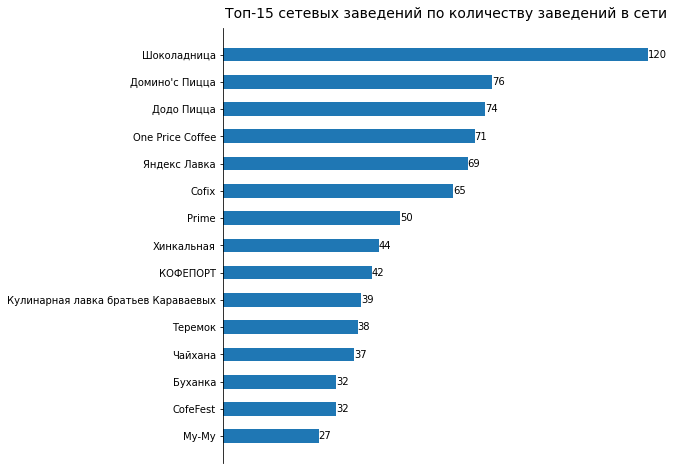

In [66]:
fig, ax = plt.subplots(figsize=(8,8))
data_chains = data_chains.sort_values(by='count_object', ascending=True)
bars = plt.barh(data_chains.index, data_chains['count_object'], height = 0.5)

ax.spines[['right', 'top', 'bottom']].set_visible(False) 
ax.xaxis.set_visible(False)

ax.bar_label(bars)
ax.set_title('Топ-15 сетевых заведений по количеству заведений в сети', fontsize=14, pad=10)
plt.show()

В топ-5 популярных сетей заведений входят кофейни и пиццерии, что свидетельствует о том, что в основном люди берут кофе с собой, либо в обеденный перерыв ходят в пиццерию.

### 3.4 Распределение заведений по округам <a id="districts"></a>

Посмотрим, как распределяются заведения по районам Москвы.

В наших данных присутствуют все районы Москвы.

In [67]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [68]:
data_district = data.pivot_table(index='district',columns='category',values='name', aggfunc='count')
data_district['total']=data_district.sum(axis=1)
data_district

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,159,40,797
Западный административный округ,50,36,62,239,148,71,218,24,848
Северный административный округ,68,39,58,234,193,77,188,41,898
Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Южный административный округ,68,25,85,264,131,73,202,44,892


Представим данные в таблице в виде процентов от общего числа заведений по каждому району.

In [69]:
for column in ['кафе', 'ресторан', "кофейня","пиццерия","столовая","быстрое питание","бар,паб","булочная"]:
    data_district[column]= round(data_district[column] * 100 /data_district['total'],2) 

In [70]:
fig = go.Figure()

fig = px.bar(data_district, y=data_district.index, 
             x=["бар,паб","булочная","быстрое питание","кафе","кофейня","пиццерия", "ресторан", "столовая"], 
             title="Распределение заведений в разрезе категорий по округам", text_auto=True)
fig.update_layout(xaxis_title="%", yaxis_title="",height=300,
                  width=1035,margin=dict(l=0, r=0, t=25, b=0))
                  
fig.show()



Таким образом, видим, что практически во всех округах больше всего кафе, на втором месте рестораны и на третьем кофейни. Только в центральном округе, как деловом и культурном центре города, больше всего ресторанов, а на втором месте находятся кафе.

### 3.5 Исследование рейтинга заведений <a id="ratings"></a>

Посмотрим, как изменяется рейтинг заведений в зависимости от категории заведения.

In [71]:
data_rating = data.pivot_table(index='category', values='rating',aggfunc='mean').sort_values(by='rating', ascending=True)
data_rating['rating'] = round(data_rating['rating'],2)
data_rating

,rating
category,
быстрое питание,4.05
кафе,4.12
столовая,4.21
булочная,4.27
кофейня,4.28
ресторан,4.29
пиццерия,4.30
"бар,паб",4.39


Найдем средний рейтинг всех заведений из таблицы и средний рейтинг заведений 

In [72]:
print('Средний рейтинг всех заведений:',round(data['rating'].mean(),2))
print('Средний рейтинг категорий заведений:',round(data_rating['rating'].mean(),2))

Средний рейтинг всех заведений: 4.23
Средний рейтинг категорий заведений: 4.24


Построим график распределения категорий заведений по среднему рейтингу и отметим категории, рейтинг которых выше среднего.

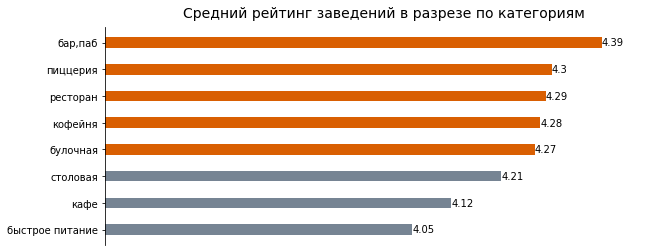

In [73]:

rating_cutoff = 4.25
highlight_colour = '#d95f02'
non_highlight_colour = '#768493'

data_rating['colours'] = data_rating['rating'].apply(lambda x: highlight_colour if x >= rating_cutoff else non_highlight_colour)


fig, ax = plt.subplots(figsize=(10,4))
plt.xlim(3.5,4.5)
bars = plt.barh(data_rating.index, data_rating['rating'], height = 0.4, color=data_rating['colours'])

ax.spines[['right', 'top', 'bottom']].set_visible(False) 
ax.xaxis.set_visible(False)

ax.bar_label(bars)
ax.set_title('Средний рейтинг заведений в разрезе по категориям', fontsize=14, pad=10)
plt.show()

Таким образом, видно, что среди всех категорий ниже среднего имеют оценки кафе, столовые и заведения быстрого питания. 

Посмотрим влияет ли на оценку заведения его сетевая принадлежность.

In [74]:
data_rating_1 = data.pivot_table(index='category', columns='chain',values='rating', aggfunc='mean')
data_rating_1.columns=['not_chain','chain']
data_rating_1['not_chain'] = round(data_rating_1['not_chain'],2)
data_rating_1['chain'] = round(data_rating_1['chain'],2)
data_rating_1.sort_values(by=['chain'], ascending=False)

,not_chain,chain
category,,
"бар,паб",4.39,4.39
булочная,4.24,4.29
пиццерия,4.32,4.28
столовая,4.20,4.24
ресторан,4.33,4.23
кофейня,4.35,4.21
кафе,4.09,4.20
быстрое питание,4.05,4.06


Разделение на сетевые и несетвые заведения показало, что в сетевых заведениях оценку ниже среднего имеют заведения быстрого питания, кафе и кофейни, а в несетевых - заведения быстрого питания, столовые и кафе.

Таким образом, заведения быстрого питания и кафе имеют оценки ниже среднего, хотя кафе лучше предпочесть из сетевых заведений. Выбирая столовую в качестве места, где можно поесть, стоит отдать предпочтение столовой, входящей в сеть заведений, а кофе брать не в сетевых кофейнях. И можно отметить, что рестораны, не входящие в сеть заведений, имеют в среднем оценку выше, чем сетевые рестораны.

In [75]:
data_rat = data.groupby('district',as_index=False)['rating'].agg('median')
data_rat

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [76]:
# загружаем JSON-файл с границами округов Москвы
# try:
#     state_geo = 'D:\\python\\admin_level_geomap.geojson'
# except:    
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
     geo_data=state_geo,
     data=data_rat,
     columns=['district', 'rating'],
     key_on='feature.name',
     fill_color='YlGnBu',
     fill_opacity=0.3,
     legend_name='Медианный рейтинг заведений по районам',
 ).add_to(m)

# выводим карту
m

In [77]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

На карте сразу видны округа, в которых располагаются заведения и их медианная оценка.

### 3.6 Улицы и заведения <a id="streets"></a>

Получим список улиц, на которых расположены заведения, и количество заведений на этих улицах. Ограничимся топ-15.

In [78]:
data_street=data.groupby('street', as_index=False)['chain'].agg('count').sort_values('chain', ascending=False)
data_street.columns = ['street','count']
data_street[:15]

,street,count
1136,проспект Мира,183
815,Профсоюзная улица,122
1133,проспект Вернадского,108
564,Ленинский проспект,107
562,Ленинградский проспект,95
414,Дмитровское шоссе,88
494,Каширское шоссе,77
336,Варшавское шоссе,76
563,Ленинградское шоссе,70
586,Люблинская улица,60


Посмотрим сколько заведений каждой категории находятся на этих улицах

In [79]:
data_cat=data.pivot_table(index='street',columns='category',values='name',aggfunc='count')
data_street_category = data_street.merge(data_cat, on='street')
data_street_category_top = data_street_category[:15]
data_street_category_top

,street,count,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,проспект Мира,183,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
1,Профсоюзная улица,122,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
2,проспект Вернадского,108,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
3,Ленинский проспект,107,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
4,Ленинградский проспект,95,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,Дмитровское шоссе,88,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
6,Каширское шоссе,77,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
7,Варшавское шоссе,76,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
8,Ленинградское шоссе,70,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
9,Люблинская улица,60,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0


In [80]:
for column in ['кафе', 'ресторан', "кофейня","пиццерия","столовая","быстрое питание","бар,паб","булочная"]:
    data_street_category_top.loc[:,column]= round(data_street_category_top.loc[:,column] * 100 /data_street_category_top.loc[:,'count'],1) 

/opt/conda/lib/python3.9/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [81]:
fig = go.Figure()

fig = px.bar(data_street_category_top, y='street', 
             x=["бар,паб","булочная","быстрое питание","кафе","кофейня","пиццерия", "ресторан", "столовая"], 
             title="Распределение заведений в разрезе категорий по улицам", text_auto=True)
fig.update_layout(xaxis_title="%", yaxis_title="",height=600,
                  width=1035,margin=dict(l=0, r=0, t=25, b=0))
                  
fig.show()



На улицах с самым большим количеством заведений, как правило, предсталены все категории, большую часть составляют кафе, рестораны и кофейни. Однако, есть улицы, где не так много кафе, но зато много кофеен и баров. Булочные и столовые могут быть или в единичных экземплярах или вовсе отсутствовать на улице.

In [82]:
data_1=data.loc[:,['rating']]
data_1['street'] = data.loc[:,'street']
data_a = data_street_category.query('count==1').merge(data_1, on='street')
display(data_a.sort_values(by='rating', ascending=False).head(20))

,street,count,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,rating
249,1-й Рижский переулок,1,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,5.0
377,метро Войковская,1,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,5.0
148,Архангельский переулок,1,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,5.0
203,Гурьевский проезд,1,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,5.0
233,1-я Фрунзенская улица,1,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,5.0
262,3-я Радиаторская улица,1,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,5.0
284,2-й Силикатный проезд,1,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,5.0
339,Светлогорский проезд,1,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,5.0
369,парк Технических видов спорта,1,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,5.0
18,район Проспект Вернадского,1,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,5.0


В Москве есть 498 улиц, на которых располагается только по одному заведению, в основном это кафе, рестораны и кофейни.

In [83]:
data_list= data_a['street']
data_street_1 = data[data['street'].isin(data_list)]
data_street_1

,name,address,district,name_translit,category,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
12,Заправка,"Москва, МКАД, 80-й километр, 1",Северный административный округ,заправка,кафе,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,80-й километр,False
15,Дом обеда,"Москва, улица Бусиновская Горка, 2",Северный административный округ,дом обеда,столовая,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,"Москва, Прибрежный проезд, 7",Северный административный округ,7/12,кафе,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,,,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,"Москва, парк Левобережный",Северный административный округ,в парке вкуснее,кофейня,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,,,NaN,NaN,1,NaN,парк Левобережный,False
28,Mafe,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,мафе,кафе,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,78-й километр,False
58,Coffeekaldi's,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,соффеекалдиьс,кофейня,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,чебуречная история,кофейня,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,,,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
64,Testo мания,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,тесто мания,кофейня,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,,,NaN,NaN,0,NaN,Лианозовский парк культуры и отдыха,False
71,CofeFest,"Москва, Новгородская улица, 23А",Северо-Восточный административный округ,софефест,кофейня,пн-пт 08:00–19:00,55.901799,37.577672,4.1,,,NaN,NaN,1,NaN,Новгородская улица,False
73,Веранда,"Москва, парк Алтуфьево",Северо-Восточный административный округ,веранда,ресторан,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,,,NaN,NaN,1,NaN,парк Алтуфьево,False


In [84]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_street_1.apply(create_clusters, axis=1)

# выводим карту
m

In [85]:
data_bill = data.groupby('district',as_index=False)['middle_avg_bill'].agg('median')
data_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [86]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
     geo_data=state_geo,
     data=data_bill,
     columns=['district', 'middle_avg_bill'],
     key_on='feature.name',
     fill_color='YlGnBu',
     fill_opacity=0.3,
     legend_name='Медианный чек заведений по районам',
 ).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_avg_bill']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма, у которой есть данные о счете
data.query('middle_avg_bill > 0').apply(create_clusters, axis=1)

# выводим карту
m

Как видим, самые дорогие заведения находятся в центральном и западном административных округах.

Посмотрим, в каких округах находятся самые дорогие и самые дешевые заведения по каждой из категорий рейтинги этих заведений.

In [87]:
data_category_bill = data.pivot_table(index='district',columns='category',values='middle_avg_bill')
data_category_bill

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,1209.038462,263.888889,831.727273,607.941176,486.111111,700.734694,1221.455882,364.700000
Западный административный округ,1305.555556,723.125000,432.333333,826.838710,694.444444,905.071429,1478.232759,565.000000
Северный административный округ,1572.810811,625.000000,327.130435,723.823529,495.736842,722.618182,1312.781250,337.500000
Северо-Восточный административный округ,986.913043,515.714286,435.655172,673.701299,433.157895,579.463415,1024.571429,325.238095
Северо-Западный административный округ,1057.142857,200.000000,295.000000,797.968750,440.636364,682.583333,1235.833333,298.636364
Центральный административный округ,1479.739884,1237.916667,532.081633,765.176190,794.764706,1104.839506,1561.059113,319.886364
Юго-Восточный административный округ,1043.181818,375.000000,479.142857,589.210526,263.000000,561.600000,931.629630,288.928571
Юго-Западный административный округ,995.526316,556.666667,411.315789,594.655172,381.818182,786.657143,1117.358974,311.666667
Южный административный округ,1079.107143,458.333333,376.923077,696.532258,504.777778,662.930233,1393.333333,291.392857


In [88]:
data_category_rating = data.pivot_table(index='district',columns='category',values='rating', aggfunc='median')
data_category_rating

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,4.30,4.2,4.20,4.2,4.3,4.30,4.3,4.30
Западный административный округ,4.50,4.3,4.10,4.2,4.2,4.30,4.3,4.25
Северный административный округ,4.35,4.3,4.15,4.3,4.3,4.30,4.3,4.20
Северо-Восточный административный округ,4.30,4.3,4.20,4.2,4.3,4.25,4.3,4.20
Северо-Западный административный округ,4.40,4.3,4.05,4.2,4.3,4.30,4.3,4.20
Центральный административный округ,4.50,4.4,4.30,4.3,4.3,4.40,4.4,4.30
Юго-Восточный административный округ,4.40,4.2,4.10,4.2,4.3,4.30,4.3,4.20
Юго-Западный административный округ,4.40,4.3,4.20,4.2,4.3,4.30,4.3,4.20
Южный административный округ,4.40,4.4,4.20,4.2,4.3,4.30,4.3,4.30


Сравнивая эти две таблицы можно сделать выводы, где находятся самые дешевые и при этом не с самым низким рейтингом заведения. 

Например, желающие пойти в бар могут выбрать заведения в Юго-Западном округе, так как средний чек в этих заведениях один из самых низких, а рейтинг 4.4, что выше среднего.

### 3.7 Выводы <a id="conclusions"></a>

У нас есть данные о 8399 заведениях общественного питания, в общем числе заведений общественного питания превалирует кафе, в топ-3 типов заведений также входят рестораны и кофейни. Если сравнивать сетевые и несетевые заведения, то можно сказать, что в тройку лидеров по количеству заведений категорий входят кафе, рестораны и кофейни.

В категориях булочных, пиццерий и кофеен большую половину заведений занимают сетевые заведения, а вот в категории кафе только треть - сетевые заведения, меньше всего сетевые заведения представлены в категориях баров и столовых, но эти типы заведений занимают лишь 9.1% и 3.75% от общего количества заведений.

В барах и ресторанах наибольшее количество посадочных мест. Возможно, это связано с тем, что в барах не требуется много место для кухни и других подсобных помещений и максимум площади отводится под зал, в котором есть барная стойка и много столиков. В ресторанах, возможно, владельцы могут позволить себе выделить большую площадь под посадочные места.

Меньше всего мест в булочных, но и сам вид заведения предполагает, что люди в основном заходят и покупают выпечку с собой, а не сидят в заведении. 
Сетевые заведения в целом имеют больше посадочных мест, чем несетевые, что вполне объяснимо. Если заведение входит в сеть, то это означает, что оно пользуется известностью и популярностью самой сети, а не конкретного заведения. Качество предостовляемых услуг в каждом заведении сети также находится примерно на одном уровне, поэтому посетитель выбирает не конкретное заведение, а именно сеть, поэтому в сетевых заведениях посадочных мест больше. 

Исследуя распределение количества заведений общественного питания по административным округам, видим, что в центральном административном округе располагается абсолютное большинство заведений, далее идут северный, южный и северо-восточный округа, разница в количестве при этом составляет 2.5 раза. Практически во всех округах больше всего кафе, на втором месте рестораны и на третьем кофейни. Только в центральном округе, как деловом и культурном центре города, больше всего ресторанов, а на втором месте находятся кафе.

Разделение на сетевые и несетвые заведения показало, что в сетевых заведениях оценку ниже среднего имеют заведения быстрого питания, столовые и кофейни, а в несетевых - заведения быстрого питания и кафе.

Таким образом, заведения быстрого питания и кафе имеют оценки ниже среднего, хотя кафе лучше предпочесть из сетевых заведений. Выбирая столовую в качестве места, где можно поесть, стоит отдать предпочтение столовой, не входящей в сеть заведений, и кофе брать не в сетевых кофейнях. И можно отметить, что рестораны, не входящие в сеть заведений, имеют в среднем оценку выше, чем сетевые рестораны.
Выбирая заведение общественного питания, лучше всего посетить заведение в центральном административном округе, там средний рейтинг составляет 4.4, хуже всего оценивают места в северо- и юго-восточных округах, там оценка всего 4.2.

Проще всего найти подходящее место можно на проспекте Мира, там находится 183 заведения, на Профсоюзной улице -	122, на	проспекте Вернадского -	108, Ленинский проспект порадует 107 заведениями, а Ленинградский проспект предоставит на выбор 95.
На улицах с самым большим количеством заведений, как правило, предсталены все категории, большую часть составляют кафе, рестораны и кофейни. Однако, есть улицы, где не так много кафе, но зато много кофеен и баров. Булочные и столовые могут быть или в единичных экземплярах или вовсе отсутствовать на улице.

Если рассматривать средний счет в заведении, то можно сказать, что самые дорогие заведения располагаются в центральном и западном административных округах, самые дешевые в юго-восточном, южном и восточном округах. При этом чем ближе к центру города, тем заведения дороже.

Сравнили, в каких округах находятся самые дорогие и самые дешевые заведения по каждой из категорий и рейтинги этих заведений.
Так, например, желающие пойти в бар могут выбрать заведения в Юго-Западном округе, так как средний чек в этих заведениях один из самых низких, а рейтинг 4.4, что выше среднего.

## 4. Открываем кофейню <a id="coffee_open"></a>

Изучим, в каком округе города лучше всего открывать кофейню. Для этого посмотрим, сколько кофеен располагается в каждом административном районе.

In [89]:
coffee = data[data['category']=='кофейня']
coffee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1411 entries, 3 to 8393
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1411 non-null   object 
 1   address            1411 non-null   object 
 2   district           1411 non-null   object 
 3   name_translit      1411 non-null   object 
 4   category           1411 non-null   object 
 5   hours              1411 non-null   object 
 6   lat                1411 non-null   float64
 7   lng                1411 non-null   float64
 8   rating             1411 non-null   float64
 9   price              1411 non-null   object 
 10  avg_bill           1411 non-null   object 
 11  middle_avg_bill    200 non-null    float64
 12  middle_coffee_cup  521 non-null    float64
 13  chain              1411 non-null   int64  
 14  seats              750 non-null    float64
 15  street             1411 non-null   object 
 16  is_24_7            1411 

In [90]:
district_coffee = coffee.groupby('district', as_index = False)['name'].agg('count')
district_coffee.columns = ['district','count']
district_coffee.sort_values(by='count',ascending=False)

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,148
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


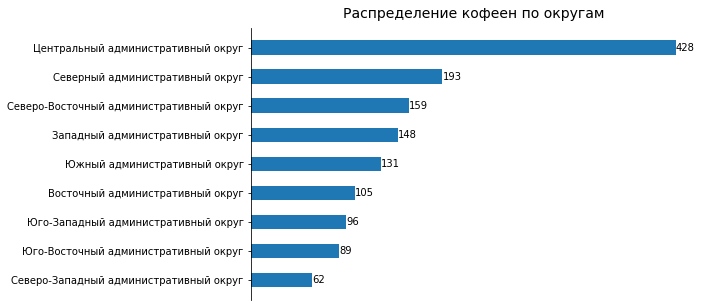

In [91]:
fig, ax = plt.subplots(figsize=(8,5))
district_coffee = district_coffee.sort_values(by='count')
bars = plt.barh(district_coffee['district'], 
                district_coffee['count'], height = 0.5)

ax.spines[['right', 'top', 'bottom']].set_visible(False) 
ax.xaxis.set_visible(False)

ax.bar_label(bars)
ax.set_title('Распределение кофеен по округам', fontsize=14, pad=10)
plt.show()

Самое большое количество кофеен находится в Центральном округе, меньше всего в Северо-Западном.

In [92]:
coffee['street'].value_counts()

 проспект Мира                             36
 Ленинградский проспект                    25
 Ленинский проспект                        23
 Профсоюзная улица                         18
 проспект Вернадского                      16
 Каширское шоссе                           16
 Варшавское шоссе                          14
 Кутузовский проспект                      13
 Новослободская улица                      13
 Ленинградское шоссе                       13
 Новодмитровская улица                     12
 Люблинская улица                          11
 Дмитровское шоссе                         11
 улица Вавилова                            10
 Волгоградский проспект                     9
 Бутырская улица                            9
 Алтуфьевское шоссе                         9
 Ярцевская улица                            8
 Сельскохозяйственная улица                 8
 Измайловское шоссе                         8
 Головинское шоссе                          8
 Береговой проезд                 

У нас есть данные о 1411 кофейнях в Москве, большая часть которых располагается в Центральном, Северном и Северо-восточных административных округах, при этом на проспекте Мира находятся 36 кофеен, на Ленинградском проспекте - 25, а на Ленинском проспекте - 23. 

Рассмотрим, сколько кофеен сетевых и несетевых находятся в каждом округе. 

In [93]:
coffee_dist = coffee.pivot_table(index='district',columns='chain',values='name',aggfunc='count')
coffee_dist.columns = ['not_chain','chain']
coffee_dist

,not_chain,chain
district,,
Восточный административный округ,54,51
Западный административный округ,56,92
Северный административный округ,96,97
Северо-Восточный административный округ,80,79
Северо-Западный административный округ,28,34
Центральный административный округ,207,221
Юго-Восточный административный округ,60,29
Юго-Западный административный округ,46,50
Южный административный округ,65,66


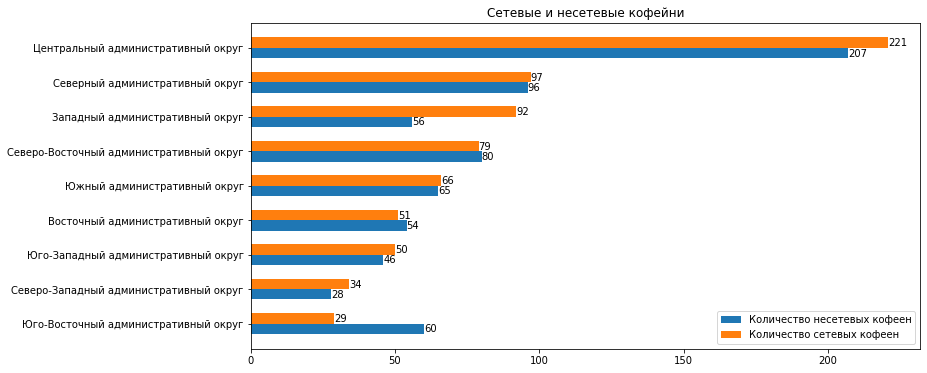

In [94]:
width = 0.3
x = np.arange(coffee_dist.shape[0])
coffee_dist = coffee_dist.sort_values(by='chain', ascending=True)
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.barh(x-width/2, coffee_dist['not_chain'], width, label='Количество несетевых кофеен')
rects2 = ax.barh(x + width/2, coffee_dist['chain'], width, label='Количество сетевых кофеен')
ax.bar_label(rects1)
ax.bar_label(rects2)
ax.set_title('Сетевые и несетевые кофейни')
ax.set_yticks(x)
ax.set_yticklabels(coffee_dist.index)
ax.legend()
plt.show()


Меньше всего несетевых кофеен также находятся в Северо-Западном, Юго-Западном и Восточном административных округах.

In [95]:
coffee[coffee['is_24_7']==True]['name'].count()

59

In [96]:
coffee_24_7 = coffee.pivot_table(index='district', columns='is_24_7', values='name', aggfunc='count')
coffee_24_7.columns = ['not_day_night','day_night']
coffee_24_7

,not_day_night,day_night
district,,
Восточный административный округ,100,5
Западный административный округ,139,9
Северный административный округ,188,5
Северо-Восточный административный округ,156,3
Северо-Западный административный округ,60,2
Центральный административный округ,402,26
Юго-Восточный административный округ,88,1
Юго-Западный административный округ,89,7
Южный административный округ,130,1


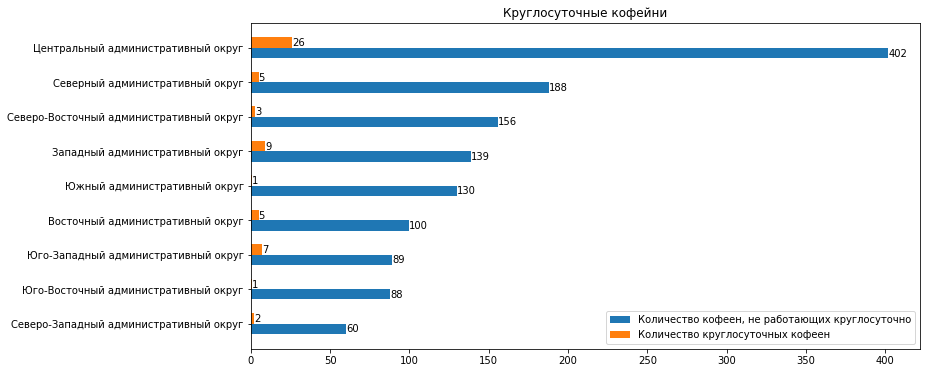

In [97]:
width = 0.3
x = np.arange(coffee_24_7.shape[0])
coffee_24_7 = coffee_24_7.sort_values(by='not_day_night', ascending=True)
fig, ax = plt.subplots(figsize=(12,6))
rects1 = ax.barh(x-width/2, coffee_24_7['not_day_night'], width, label='Количество кофеен, не работающих круглосуточно')
rects2 = ax.barh(x + width/2, coffee_24_7['day_night'], width, label='Количество круглосуточных кофеен')
ax.bar_label(rects1)
ax.bar_label(rects2)
ax.set_title('Круглосуточные кофейни')
ax.set_yticks(x)
ax.set_yticklabels(coffee_24_7.index)
ax.legend()
plt.show()


Среди всех кофеен 59 работают круглосуточно. Из них, меньше всего круглосуточных в Юго-Восточном и Южном административных округах.

In [98]:
coffee.groupby('district')['rating'].agg('median')

district
Восточный административный округ           4.3
Западный административный округ            4.2
Северный административный округ            4.3
Северо-Восточный административный округ    4.3
Северо-Западный административный округ     4.3
Центральный административный округ         4.3
Юго-Восточный административный округ       4.3
Юго-Западный административный округ        4.3
Южный административный округ               4.3
Name: rating, dtype: float64

In [99]:
coffee_rating = coffee.pivot_table(index='district',columns='chain',values='rating',aggfunc='median')
coffee_rating.columns=['not_chain','chain']
coffee_rating = coffee_rating.sort_values(by='not_chain')
coffee_rating

,not_chain,chain
district,,
Западный административный округ,4.30,4.2
Северо-Восточный административный округ,4.35,4.2
Юго-Восточный административный округ,4.35,4.2
Восточный административный округ,4.40,4.2
Северный административный округ,4.40,4.2
Центральный административный округ,4.40,4.3
Юго-Западный административный округ,4.40,4.3
Южный административный округ,4.40,4.2
Северо-Западный административный округ,4.45,4.2


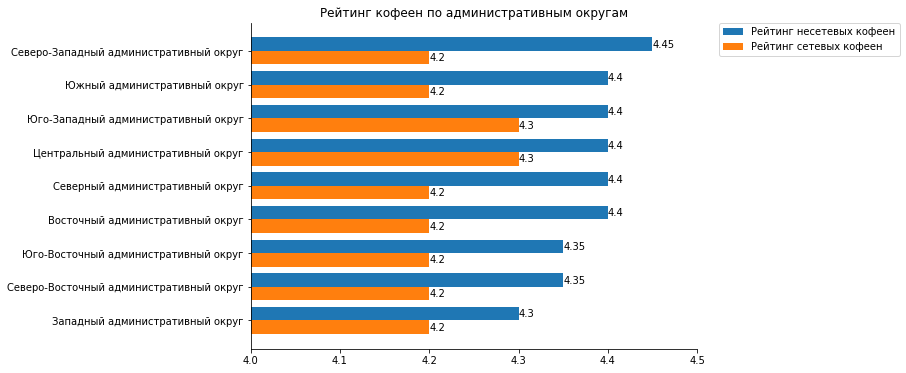

In [100]:
width = 0.4
x = np.arange(coffee_rating.shape[0])

fig, ax = plt.subplots(figsize=(8,6))
plt.xlim(4,4.5)
#data_type = data_type.sort_values(by='total_count')
rects1 = ax.barh(x + width/2, coffee_rating['not_chain'], width, label='Рейтинг несетевых кофеен')
rects2 = ax.barh(x - width/2, coffee_rating['chain'], width, label='Рейтинг сетевых кофеен')
ax.bar_label(rects1)
ax.bar_label(rects2)
ax.set_title('Рейтинг кофеен по административным округам')
ax.set_yticks(x)
ax.set_yticklabels(coffee_rating.index)
ax.spines[['right', 'top']].set_visible(False) 
#ax.xaxis.set_visible(True)
ax.legend()
plt.legend(bbox_to_anchor=( 1.05 , 1 ), loc='upper left', borderaxespad= 0 )
plt.show()


Как видно, рейтинг у несетевых кофеен выше, чем у сетевых заведений. При этом, самый высокий рейтинг (4.45) у кофеен Северо-Западного административного округа. При этом в этом округе меньше всего кофеен (62 шт), из них больше половины - сетевые с рейтингом 4.2. Исходя из этих данных, Северо-Западный район является приоритетным при рассмотрении места для открытия новой кофейни. 

In [101]:
coffee_cost=coffee.pivot_table(index='district',columns='chain',values='middle_coffee_cup',aggfunc=['min','median','max'])
coffee_cost.columns=['min_cost_not_chain','min_cost_chain','middle_cost_not_chain',
                     'middle_cost_chain','max_cost_not_chain','max_cost_chain']
coffee_cost

,min_cost_not_chain,min_cost_chain,middle_cost_not_chain,middle_cost_chain,max_cost_not_chain,max_cost_chain
district,,,,,,
Восточный административный округ,90.0,60.0,135.0,135.0,200.0,256.0
Западный административный округ,149.0,60.0,177.5,220.0,300.0,300.0
Северный административный округ,60.0,60.0,165.0,140.0,315.0,325.0
Северо-Восточный административный округ,110.0,60.0,162.5,162.0,254.0,297.0
Северо-Западный административный округ,120.0,60.0,165.0,172.0,250.0,270.0
Центральный административный округ,60.0,60.0,195.0,180.0,320.0,328.0
Юго-Восточный административный округ,75.0,60.0,150.0,130.0,375.0,256.0
Юго-Западный административный округ,100.0,95.0,190.5,199.5,250.0,291.0
Южный административный округ,100.0,60.0,170.0,109.5,275.0,266.0


При открытии кофейни стоит придерживаться средних цен, установившихся в районе.

В Москве работают  1411 кофейни, большая часть которых располагается в Центральном, Северном и Северо-восточных административных округах, при этом на проспекте Мира находятся 36 кофеен, на Ленинградском проспекте - 25, а на Ленинском проспекте - 23. 

Самое большое количество кофеен находится в Центральном округе, меньше всего в Северо-Западном.
Меньше всего несетевых кофеен также находятся в Северо-Западном, Юго-Западном и Восточном административных округах.
Среди всех кофеен 59 работают круглосуточно. Из них, меньше всего круглосуточных в Юго-Восточном и Южном административных округах.

Рейтинг у несетевых кофеен выше, чем у сетевых заведений. При этом, самый высокий рейтинг (4.45) у кофеен Северо-Западного административного округа. При этом в этом округе меньше всего кофеен (62 шт), из них больше половины - сетевые с рейтингом 4.2. Исходя из этих данных, Северо-Западный район является приоритетным при рассмотрении места для открытия новой кофейни, также можно рассматривать Южный административный округ. 

При открытии кофейни стоит придерживаться средних цен, установившихся в округе, ориентируясь на цены в несетевых кофейнях, но видно, что в сетевых заведениях цены ниже.

Презентация: https://drive.google.com/file/d/1niEFvP_w-W4GxqbP9L7cXR8DZJB2i0sG/view?usp=sharing